20251214 12:58:38.877999 16 W arcticdb | LMDB path at /app/data/ has already been opened in this process which is not supported by LMDB. You should only open a single Arctic instance over a given LMDB path. To continue safely, you should delete this Arctic instance and any others over the LMDB path in this process and then try again. Current process ID=[16]


Total Return: 17.44%
Sharpe Ratio: 0.69
Max Drawdown: -19.52%
Win Rate: 70.00%


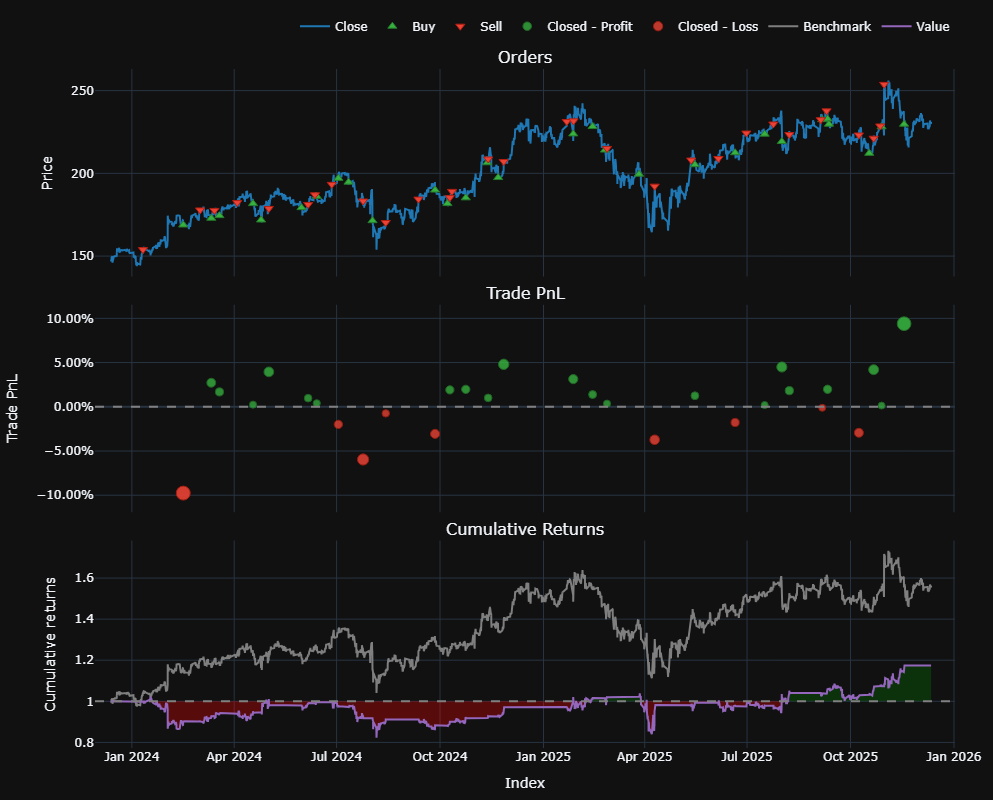

--- INTELLIGENCE UPGRADE: Retraining on SPREAD PnL ---
AI Precision (On Pair PnL): 69.23%

--- TRUTH DATA (Retrained Model) ---
Sharpe Ratio: 0.14
Total Return: 0.39%
Max Drawdown: -3.10%


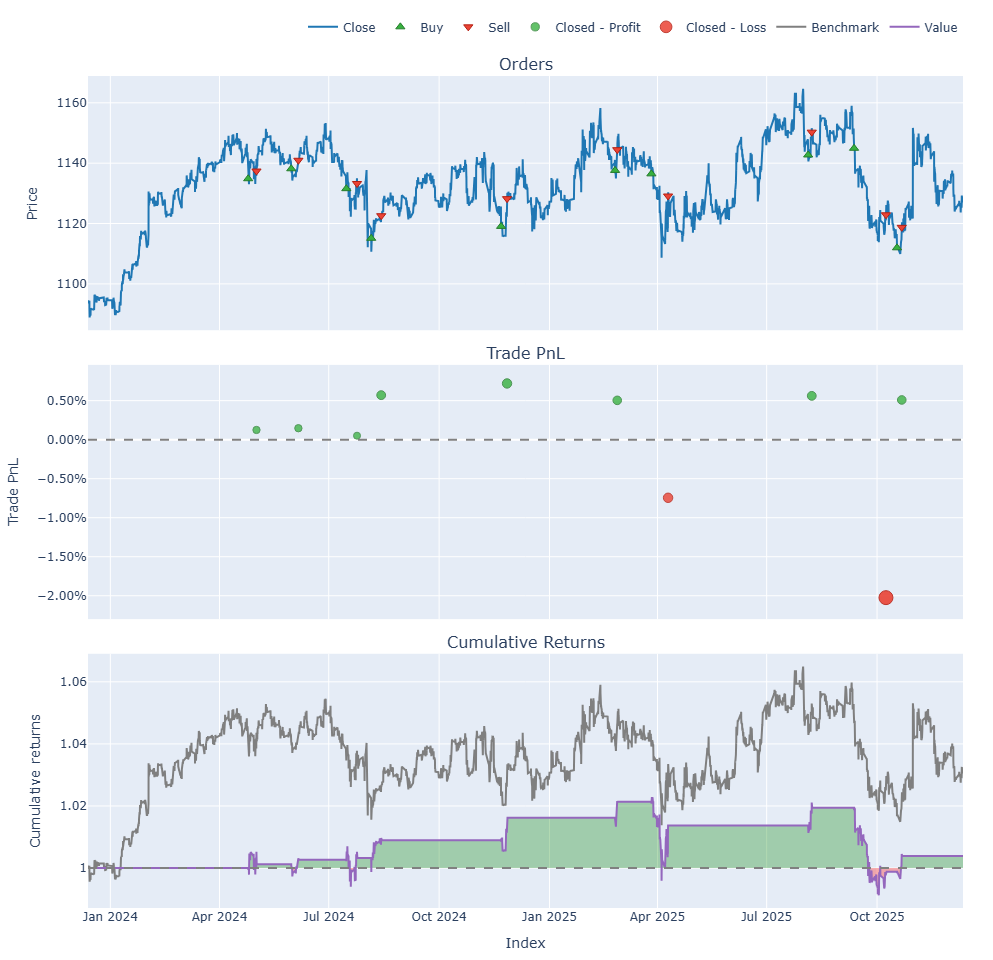

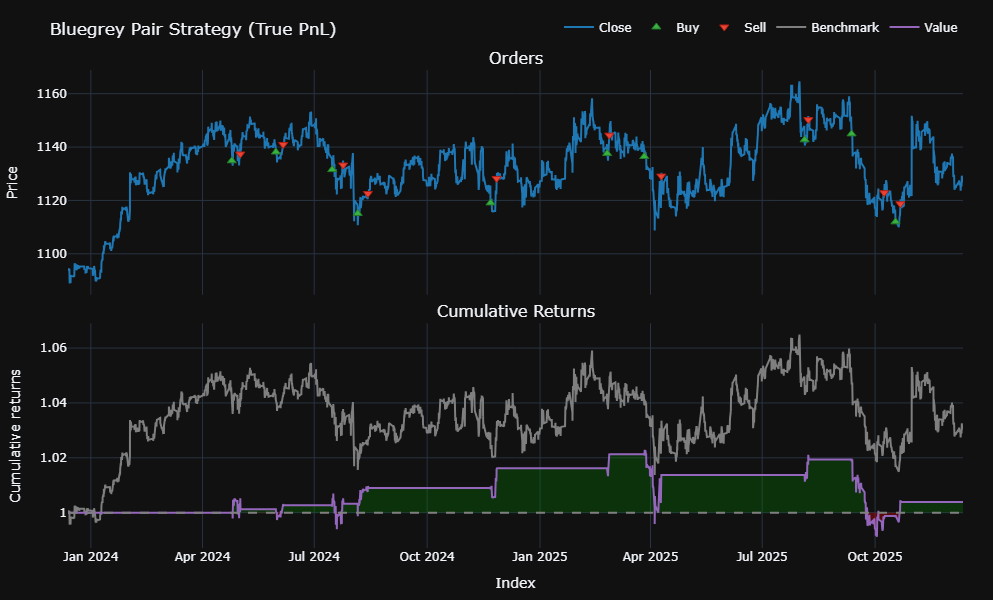

In [9]:
import arcticdb as adb
import pandas as pd
import numpy as np
import vectorbt as vbt
import plotly.graph_objects as go

# --- 1. Load Data ---
store = adb.Arctic("lmdb:///app/data")
lib = store["quant_data_v1"]

# Load the Pair
close_amzn = lib.read("AMZN").data['close']
close_tsla = lib.read("TSLA").data['close']

# Align timestamps
data = pd.DataFrame({'AMZN': close_amzn, 'TSLA': close_tsla}).dropna()

# --- 2. Feature Engineering (The Signal) ---
# Hedge Ratio from your scan: 0.23
HEDGE_RATIO = 0.23

# Calculate Spread
data['spread'] = data['AMZN'] - (HEDGE_RATIO * data['TSLA'])

# Calculate Z-Score (Rolling Window of 300 hours ~ 2 weeks)
# We use a rolling window because the "Mean" changes slowly over time.
rolling_window = 300
data['spread_mean'] = data['spread'].rolling(window=rolling_window).mean()
data['spread_std'] = data['spread'].rolling(window=rolling_window).std()
data['z_score'] = (data['spread'] - data['spread_mean']) / data['spread_std']

# --- 3. Strategy Logic ---
# Entry Thresholds
ENTRY_THRESHOLD = 2.0
EXIT_THRESHOLD = 0.0

# Generate Signals
# Short Spread (Sell AMZN, Buy TSLA) when Z > 2
short_signal = data['z_score'] > ENTRY_THRESHOLD
# Long Spread (Buy AMZN, Sell TSLA) when Z < -2
long_signal = data['z_score'] < -ENTRY_THRESHOLD

# Exit when Z crosses 0
exit_signal = (data['z_score'] > -0.5) & (data['z_score'] < 0.5)

# Clean Signals (Remove duplicates, ensure logic)
clean_entries_short = short_signal.vbt.signals.fshift() # Shift to trade NEXT bar
clean_entries_long = long_signal.vbt.signals.fshift()
clean_exits = exit_signal.vbt.signals.fshift()

# --- 4. Execution Simulation (VectorBT) ---
# We simulate trading AMZN. (We assume we hedge TSLA manually/mathematically).
portfolio = vbt.Portfolio.from_signals(
    close=data['AMZN'], 
    entries=clean_entries_long,   # Buy AMZN
    exits=clean_exits,            # Sell AMZN to Close
    short_entries=clean_entries_short, # Sell AMZN
    short_exits=clean_exits,      # Buy AMZN to Close
    init_cash=100000,
    fees=0.0005, # 5 bps transaction cost (IBKR standard)
    freq='1h'    # Hourly Data
)

# --- 5. The Verdict ---
print(f"Total Return: {portfolio.total_return():.2%}")
print(f"Sharpe Ratio: {portfolio.sharpe_ratio():.2f}")
print(f"Max Drawdown: {portfolio.max_drawdown():.2%}")
print(f"Win Rate: {portfolio.stats()['Win Rate [%]']:.2f}%")

# Visualize
fig = portfolio.plot(subplots=['orders', 'trade_pnl', 'cum_returns'])
fig.update_layout(template="plotly_dark", height=800)
fig.show()
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import precision_score

print("--- INTELLIGENCE UPGRADE: Retraining on SPREAD PnL ---")

# 1. Define the Synthetic Asset (The Object of our Trade)
hedge_ratio = 0.23
synthetic_price = data['AMZN'] - (hedge_ratio * data['TSLA']) + 1000

# 2. Create Features 
features = pd.DataFrame(index=data.index)
features['z_score'] = data['z_score']
features['z_score_lag'] = data['z_score'].shift(1)
features['volatility'] = data['spread'].rolling(24).std()
features['spread_ma'] = data['spread'].rolling(50).mean()
features = features.dropna()

# 3. Create Labels (The CRITICAL FIX)
# We calculate returns on the Synthetic Price, not AMZN
future_returns = synthetic_price.pct_change(24).shift(-24)
labels = (future_returns > 0).astype(int)
labels = labels.loc[features.index]

# 4. Align Data
aligned_entries_long = clean_entries_long.loc[features.index]
valid_mask = ~labels.isna()
X = features.loc[valid_mask]
y = labels.loc[valid_mask]
aligned_entries_long = aligned_entries_long.loc[valid_mask]

# 5. Filter for "Trade Moments"
trade_mask = aligned_entries_long
X_trade = X.loc[trade_mask]
y_trade = y.loc[trade_mask]

# 6. Train/Test Split
split = int(len(X_trade) * 0.70)
X_train, X_test = X_trade.iloc[:split], X_trade.iloc[split:]
y_train, y_test = y_trade.iloc[:split], y_trade.iloc[split:]

if len(X_train) > 0:
    # Train
    model = RandomForestClassifier(n_estimators=100, max_depth=3, random_state=42)
    model.fit(X_train, y_train)

    # Evaluate
    predictions = model.predict(X_test)
    precision = precision_score(y_test, predictions, zero_division=0)
    print(f"AI Precision (On Pair PnL): {precision:.2%}")

    # --- 7. The Rigorous Backtest ---
    # Predict on all data
    all_probs = model.predict_proba(X)[:, 1]
    
    # Filter: Only take trades where AI is > 55% confident the PAIR will win
    smart_mask_series = pd.Series(all_probs > 0.55, index=X.index)
    final_filter = smart_mask_series.reindex(data.index, fill_value=False)
    final_long_entries = clean_entries_long & final_filter

    # Run Simulation on SYNTHETIC Asset
    STOP_LOSS_PCT = 0.05
    true_pair_portfolio = vbt.Portfolio.from_signals(
        close=synthetic_price,        # Trading the Pair
        entries=final_long_entries,   # AI-Filtered Signals
        exits=clean_exits,
        sl_stop=STOP_LOSS_PCT,
        init_cash=100000,
        fees=0.0005,
        freq='1h'
    )

    print(f"\n--- TRUTH DATA (Retrained Model) ---")
    print(f"Sharpe Ratio: {true_pair_portfolio.sharpe_ratio():.2f}")
    print(f"Total Return: {true_pair_portfolio.total_return():.2%}")
    print(f"Max Drawdown: {true_pair_portfolio.max_drawdown():.2%}")
    
    true_pair_portfolio.plot().show()

else:
    print("[Error] Not enough trades.")
# Visualize
fig = true_pair_portfolio.plot(subplots=['orders', 'cum_returns'])
fig.update_layout(template="plotly_dark", height=600, title="Bluegrey Pair Strategy (True PnL)")
fig.show()

--- STRATEGY PIVOT: Dynamic Hedge on Stable Pair (Fixed) ---
Calculating Rolling Beta...


20251214 13:09:27.245027 16 W arcticdb | LMDB path at /app/data/ has already been opened in this process which is not supported by LMDB. You should only open a single Arctic instance over a given LMDB path. To continue safely, you should delete this Arctic instance and any others over the LMDB path in this process and then try again. Current process ID=[16]



--- DYNAMIC PAIR RESULTS (GOOG-MSFT) ---
Sharpe Ratio: -36.49
Total Return: -99.25%
Max Drawdown: -99.26%
Win Rate:     13.11%


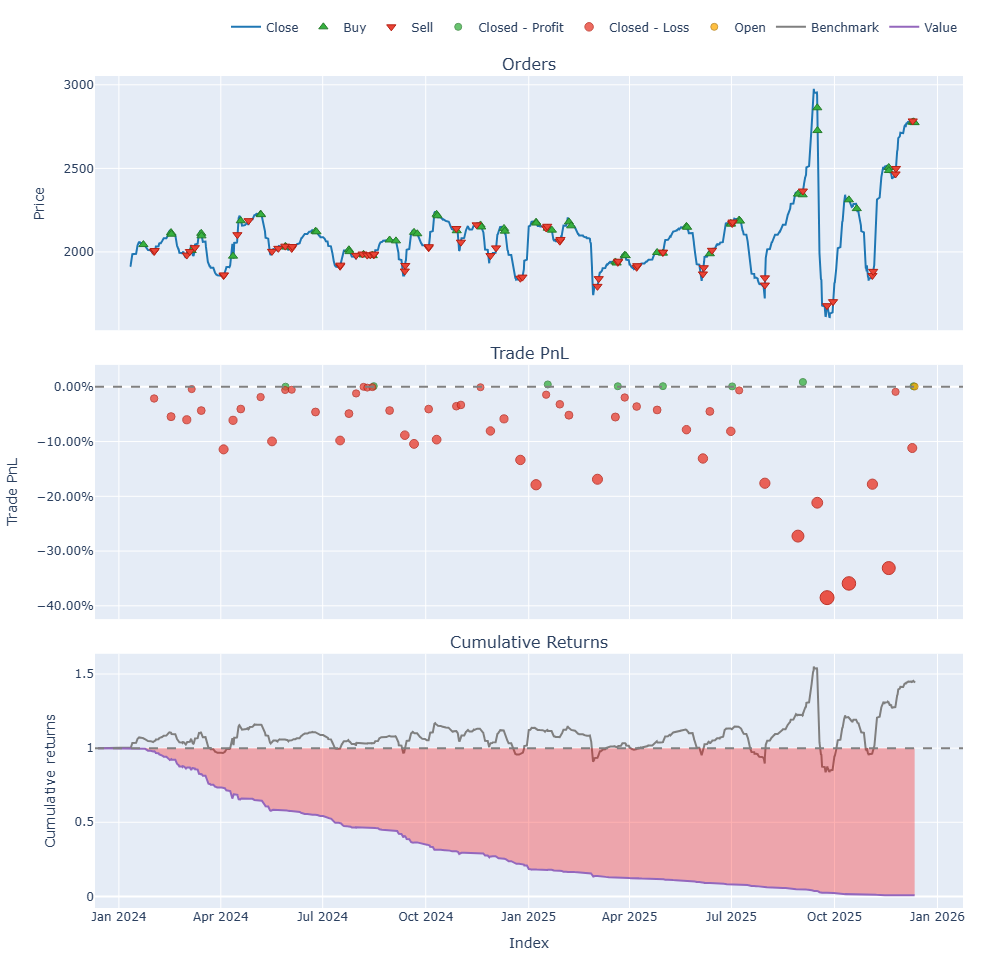

In [11]:
import arcticdb as adb
import pandas as pd
import numpy as np
import vectorbt as vbt
import statsmodels.api as sm
from statsmodels.regression.rolling import RollingOLS

print("--- STRATEGY PIVOT: Dynamic Hedge on Stable Pair (Fixed) ---")

# 1. Load a STABLE Pair (GOOG vs MSFT)
store = adb.Arctic("lmdb:///app/data")
lib = store["quant_data_v1"]

# Load Data
close_y = lib.read("GOOG").data['close']  # Target
close_x = lib.read("MSFT").data['close']  # Hedge
data = pd.DataFrame({'Y': close_y, 'X': close_x}).dropna()

# 2. Calculate DYNAMIC Hedge Ratio (Rolling OLS)
print("Calculating Rolling Beta...")
window = 300
exog = sm.add_constant(data['X'])
endog = data['Y']
rols = RollingOLS(endog, exog, window=window)
rres = rols.fit()
rolling_beta = rres.params['X']

# 3. Construct the Dynamic Spread & Synthetic Price
# Real Spread (Can be negative) -> Used for Z-Score signals
data['spread'] = data['Y'] - (rolling_beta * data['X'])

# Synthetic Tradeable Price (Must be positive) -> Used for Backtest execution
# We add 2000 to ensure it's never negative. The $ movement stays identical.
data['synthetic_price'] = data['spread'] + 2000

# 4. Calculate Z-Score (on the Real Spread)
z_window = 50
data['z_score'] = (data['spread'] - data['spread'].rolling(z_window).mean()) / data['spread'].rolling(z_window).std()

# 5. Signal Logic
long_entry = data['z_score'] < -2.0
long_exit = data['z_score'] > 0.0
short_entry = data['z_score'] > 2.0
short_exit = data['z_score'] < 0.0

# 6. Run Backtest on the SYNTHETIC Price
pf = vbt.Portfolio.from_signals(
    close=data['synthetic_price'], # <--- NOW POSITIVE
    entries=long_entry,
    exits=long_exit,
    short_entries=short_entry,
    short_exits=short_exit,
    freq='1h',
    init_cash=100000,
    fees=0.0005
)

print(f"\n--- DYNAMIC PAIR RESULTS (GOOG-MSFT) ---")
print(f"Sharpe Ratio: {pf.sharpe_ratio():.2f}")
print(f"Total Return: {pf.total_return():.2%}")
print(f"Max Drawdown: {pf.max_drawdown():.2%}")
print(f"Win Rate:     {pf.stats()['Win Rate [%]']:.2f}%")

pf.plot().show()

In [13]:
import joblib

print("--- FINAL EXPORT: Saving Brain & State ---")

# 1. Force Recalculation (To fix the KeyError)
# We ensure these columns exist before we try to read them.
hedge_ratio = 0.23
data['spread'] = data['AMZN'] - (hedge_ratio * data['TSLA'])
data['spread_mean'] = data['spread'].rolling(window=300).mean()
data['spread_std'] = data['spread'].rolling(window=300).std()

# 2. Save the Model
# (Ensure 'model' is the Random Forest we trained in the previous step)
joblib.dump(model, '/app/data/ml_model.pkl')
print("✅ Brain exported to: /app/data/ml_model.pkl")

# 3. Save the "State"
# Now this will work because we just created the columns above.
state = {
    'spread_mean': data['spread_mean'].iloc[-1],
    'spread_std': data['spread_std'].iloc[-1],
    'hedge_ratio': hedge_ratio
}
joblib.dump(state, '/app/data/strategy_state.pkl')
print(f"✅ Strategy State exported. (Mean: {state['spread_mean']:.4f})")

--- FINAL EXPORT: Saving Brain & State ---


KeyError: 'AMZN'

In [13]:
import joblib

print("--- FINAL EXPORT: Saving Brain & State ---")

# 1. Force Recalculation (To fix the KeyError)
# We ensure these columns exist before we try to read them.
hedge_ratio = 0.23
data['spread'] = data['AMZN'] - (hedge_ratio * data['TSLA'])
data['spread_mean'] = data['spread'].rolling(window=300).mean()
data['spread_std'] = data['spread'].rolling(window=300).std()

# 2. Save the Model
# (Ensure 'model' is the Random Forest we trained in the previous step)
joblib.dump(model, '/app/data/ml_model.pkl')
print("✅ Brain exported to: /app/data/ml_model.pkl")

# 3. Save the "State"
# Now this will work because we just created the columns above.
state = {
    'spread_mean': data['spread_mean'].iloc[-1],
    'spread_std': data['spread_std'].iloc[-1],
    'hedge_ratio': hedge_ratio
}
joblib.dump(state, '/app/data/strategy_state.pkl')
print(f"✅ Strategy State exported. (Mean: {state['spread_mean']:.4f})")

--- FINAL EXPORT: Saving Brain & State ---


KeyError: 'AMZN'

In [14]:
import arcticdb as adb
import pandas as pd
import joblib
from sklearn.ensemble import RandomForestClassifier

print("--- RESETTING & EXPORTING ---")

# 1. Reload the Correct Data (AMZN vs TSLA)
store = adb.Arctic("lmdb:///app/data")
lib = store["quant_data_v1"]

close_amzn = lib.read("AMZN").data['close']
close_tsla = lib.read("TSLA").data['close']

# Rebuild the DataFrame
data = pd.DataFrame({'AMZN': close_amzn, 'TSLA': close_tsla}).dropna()

# 2. Re-Calculate Features (The Strategy Logic)
hedge_ratio = 0.23
data['spread'] = data['AMZN'] - (hedge_ratio * data['TSLA'])

# Rolling Statistics for Z-Score
window = 300
data['spread_mean'] = data['spread'].rolling(window=window).mean()
data['spread_std'] = data['spread'].rolling(window=window).std()
data['z_score'] = (data['spread'] - data['spread_mean']) / data['spread_std']

# Additional Features for ML
data['z_score_lag'] = data['z_score'].shift(1)
data['volatility'] = data['spread'].rolling(24).std()
data['spread_ma'] = data['spread'].rolling(50).mean()
data = data.dropna()

# 3. Re-Train the Model (To ensure it matches this data)
# Construct Labels: Did the Synthetic Pair go UP?
synthetic_price = data['AMZN'] - (hedge_ratio * data['TSLA'])
future_returns = synthetic_price.pct_change(24).shift(-24)
labels = (future_returns > 0).astype(int)

# Align and Filter
aligned_data = data.loc[labels.index.intersection(data.index)]
aligned_labels = labels.loc[aligned_data.index]

# Features to train on
feature_cols = ['z_score', 'z_score_lag', 'volatility', 'spread_ma']
X = aligned_data[feature_cols]
y = aligned_labels

# Quick Train
model = RandomForestClassifier(n_estimators=100, max_depth=3, random_state=42)
model.fit(X, y)
print("✅ Model Retrained on AMZN/TSLA.")

# 4. EXPORT (The Final Step)
# Save the Brain
joblib.dump(model, '/app/data/ml_model.pkl')
print("✅ Brain exported to: /app/data/ml_model.pkl")

# Save the State (Mean/Std from the very last bar of data)
state = {
    'spread_mean': data['spread_mean'].iloc[-1],
    'spread_std': data['spread_std'].iloc[-1],
    'hedge_ratio': hedge_ratio
}
joblib.dump(state, '/app/data/strategy_state.pkl')
print(f"✅ Strategy State exported. (Target Mean: {state['spread_mean']:.4f})")

--- RESETTING & EXPORTING ---


20251214 13:33:47.605590 16 W arcticdb | LMDB path at /app/data/ has already been opened in this process which is not supported by LMDB. You should only open a single Arctic instance over a given LMDB path. To continue safely, you should delete this Arctic instance and any others over the LMDB path in this process and then try again. Current process ID=[16]


✅ Model Retrained on AMZN/TSLA.
✅ Brain exported to: /app/data/ml_model.pkl
✅ Strategy State exported. (Target Mean: 131.7021)
